# Imports

In [31]:
%matplotlib widget

import seaborn as sns
sns.set_theme()
sns.set_context('talk')

import sys, os, glob, time
from pathlib import Path
import copy
import numpy as np
import matplotlib.pyplot as plt

import matplotlib as mpl

from matplotlib.ticker import *
from mpl_toolkits.axes_grid1 import make_axes_locatable

from collections import OrderedDict
from functools import reduce

from skimage import io
import pandas as pd

from ipywidgets import *
from IPython.display import display

from scipy.signal import medfilt2d

import _pickle as pickle

import hdf5plugin, h5py
import pyFAI
import tifffile

import fabio
from xdart.utils import write_xye

from imageio import imwrite
from natsort import natsorted, os_sorted
import operator

from silx.io.specfile import SpecFile

from joblib import Parallel, delayed

AA = r'\mathrm{\AA}^{-1}'
whsp = '                                                     '

import warnings
warnings.filterwarnings('ignore')
plt.rcParams.update({'figure.max_open_warning': 50})

# Functions

In [ ]:
def get_tiff_img_data(fname, mask=None, threshold=None):
    img_data = tifffile.imread(fname).astype(float)
    if mask is not None:
        img[mask == 1] = np.nan

    if threshold is not None:
        img[img > threshold] = np.nan
        
    return img


def get_single_image(fname, n, mask=None, apply_threshold=True, threshold=1e8, rotation=None):
    try:
        imgs = fabio.open(fname)
    except:
        return None
    img = imgs.get_frame(n).data.astype(float)

    # Mask Hot Pixels
    if apply_threshold:
        img[img > threshold] = np.nan

    # Mask out if mask supplied
    if mask is not None:
        img[mask == 1] = np.nan
        
    return np.rot90(img, rotation//90)


def get_single_image(fname, n, mask=None):
    try:
        imgs = fabio.open(fname)
    except:
        return None
    img = imgs.get_frame(n).data.astype(float)
    
    if mask is not None:
        img[mask == 1] = np.nan
        img[img > 1e7] = np.nan
        
    return img


def get_all_images(fname, mask=None, apply_threshold=True, threshold=1e6, return_average=False, return_sum=False, rotation=None):
    try:
        imgs = fabio.open(fname)
    except:
        return None
   
    im_array = np.array(imgs.dataset).squeeze().astype(float)
    
    # Mask Hot Pixels
    if apply_threshold:
        im_array[im_array > threshold] = np.nan

    # Mask out if mask supplied
    if mask is not None:
        im_array[mask == 1] = np.nan

    if return_average and im_array.ndim == 3:
        im_array = np.nanmean(im_array, axis=0)
    if return_sum and im_array.ndim == 3:
        im_array = np.nansum(im_array, axis=0)

    if rotation:
        return np.rot90(im_array, rotation//90, axes=(1,2))
        
    return im_array


def get_nImages(fname):
    try:
        return fabio.open(fname).nframes
    except:
        return None
    

def get_tiff_array(fpaths, N):
    try:
        tiff_file = glob.glob(f'{fpaths[N-1]}/*.tif')[0]
    except IndexError:
        print('Image not found')
        return None
    
    img = fabio.open(tiff_file).data
    
    return img


def get_from_spec_file(fname, scan_number, cols):
    scan_data = SpecFile(str(fname))[scan_number]

    spec_data = {}
    for col in cols:
        if col in scan_data.labels:
            spec_data[col] = scan_data.data_column_by_name(col)
        elif col in scan_data.motor_names:
            spec_data[col] = scan_data.motor_position_by_name(col) 
        else:
            print(f'{col} does not exist')
    return spec_data

# Setup

## Data Dictionaries

In [ ]:
All_IQs = OrderedDict()

# Data Reduction

## Paths

In [ ]:
base_path = Path(r'X:\bl17-2\2025_05_Anjani')
plot_path  = base_path / 'plots'
plot_path.mkdir(exist_ok=True)

save_path  = base_path / 'processed_data'
save_path.mkdir(exist_ok=True)

calib_path = base_path / 'calibration'
xye_path  = save_path / 'xye_data'
xye_path.mkdir(exist_ok=True)

calib_file = calib_path / 'LAB6_15kev_poni.poni'
dp_mask_file1 = calib_path / 'mask_01.edf'

### Initialize integrator

In [ ]:
ai = pyFAI.load(str(calib_file))
default_mask = ai.mask

mask = default_mask.copy()

# Get Dead Pixel Mask
dp_mask1 = fabio.open(dp_mask_file1).data
mask = dp_mask1 
ai

In [ ]:
def get_scan_h5s(base_path, dirs):
    master_files = []
    for directory in dirs:
        img_paths = [
            base_path / directory,
        ]

        master_files += reduce(operator.add, [os_sorted(list(img_path.rglob('*_master.h5'))) for img_path in img_paths])
    
    return OrderedDict({m.stem[:-7]:m for m in master_files})

img_paths = [x for x in base_path.iterdir() if x.is_dir() and 'linkam' not in x.stem ]
scan_h5s = get_scan_h5s(base_path, img_paths)

#print("Corrupted Files")
#for scan, h5_file in scan_h5s.items():
#    im = get_single_image(h5_file, 0, mask=mask)
#    if im is None:
#        print(scan)
#print(scan_h5s.keys())

### Get Bad Pixels

## Show Raw data

In [ ]:
f1, f1_ax1 = plt.subplots(ncols=1, figsize=(11,9), layout='tight')
divider = make_axes_locatable(f1_ax1)
f1_cax1 = divider.append_axes('right', size='5%', pad=0.5)

img_paths = [x for x in base_path.iterdir() if x.is_dir() and 'linkam' not in x.stem ]
scan_h5s = get_scan_h5s(base_path, img_paths)

scans = list(scan_h5s.keys())

if len(scans) > 0:
    NSlider=IntSlider(min=0, max=1, step=1, value=0)
    @interact(scan=Dropdown(options=scans, value=scans[-1]),
              N=NSlider,
              minmax=FloatRangeSlider(min=1, max=100, step=0.5, value=(5,98)))
    def show_image(scan, N, minmax):
        [ax.cla() for ax in f1.get_axes()]
        f1_ax1.grid(False); f1_cax1.grid(False) 
    
        h5_file = scan_h5s[scan]
        try:
            NSlider.max = get_nImages(h5_file)-1
        except:
            f1_ax1.set_title(f'{scan} - Corrupted Data', fontsize=14)    
            return
        
        N = min(N, NSlider.max)
        im = get_single_image(h5_file, N, mask=mask)
    
        i1 = f1_ax1.imshow(im, vmin=np.nanpercentile(im, minmax[0]), vmax=np.nanpercentile(im, minmax[1]))
        plt.colorbar(i1, cax=f1_cax1)
        
        f1_ax1.set_title(f'{scan} - #{N}', fontsize=14)

# Integration

## I(Q) and I(2Th) Integration and save to XYE files

In [ ]:
while True:
    img_paths = [x for x in base_path.iterdir() if x.is_dir() and 'linkam' not in x.stem ]
    scan_h5s = get_scan_h5s(base_path, img_paths)    
    corrupted_files = []
    
    def integrate_1d(eiger_h5, n, npt=4000, mask=None, method='csr', unit="q_A^-1", threshold=1e7):
        mask[mask > threshold] = 1
        image = get_single_image(eiger_h5, n, mask=mask)
        return ai.integrate1d(image, npt=npt, mask=mask, method=method, unit=unit)
        
    def save_results(iq_file, q_all, I_all):
        with h5py.File(iq_file, 'w') as h5file:
            h5file.create_dataset('q_all', data=q_all)
            h5file.create_dataset('I_all', data=I_all)
        # print(f'Processed - Data saved to {iq_file}')
    
    def load_existing_data(iq_file):
        try:
            with h5py.File(iq_file, 'r') as h5file:
                return h5file['q_all'][:], h5file['I_all'][:]
        except:
            return None, None
    
    def process_scan(scan, save_path, npt=4000, mask=None, method='csr', unit="q_A^-1", threshold=1e9, reprocess=False):
        print(f'{scan} {whsp}', end='\r')
        iq_file = save_path / f'{scan}_processed_masked.h5'
    
        if os.path.exists(iq_file) and not reprocess:
            print(f'\r{scan} already processed ', end='\r')
            return None, None
            # return load_existing_data(iq_file)
    
        eiger_h5 = scan_h5s[scan]
        nframes = get_nImages(eiger_h5)
        if nframes is None:
            print(f'{scan}: Corrupted Data {whsp}', end='\r')
            corrupted_files.append(scan)
            return None, None
            
        print(f'{scan}: {nframes} Images {whsp}', end='\r')
        try:
            results = Parallel(n_jobs=-1, require='sharedmem')(delayed(integrate_1d) (eiger_h5, n, npt, mask, method, unit, threshold) for n in range(0, nframes))
        except:
            print(f'{scan}: Corrupted Data {whsp}', end='\r')
            corrupted_files.append(scan)
            return None, None
    
        q_all, I_all = map(np.array, zip(*results))
        save_results(iq_file, q_all, I_all)
    
        print(f'{scan}: {nframes} Images - Processed {whsp}', end='\r')
        return None, None
        return q_all, I_all
    
    reprocess = False
    t0 = time.time()
    
    for scan in scan_h5s.keys():
        q_all, I_all = process_scan(scan, save_path, npt=2000, mask=mask, method='csr', unit="q_A^-1", threshold=1e3, reprocess=reprocess)
        #if q_all is not None:
        #    All_IQs[scan] = (q_all, I_all)
    
    print(f'All scans processed - Total time: {time.time() - t0:.1f}s (Sleeping for 2s) {whsp}', end='\r')
    time.sleep(2)

In [ ]:
fig3, ax3 = plt.subplots(ncols=1, figsize=(13, 7), layout='tight')

labels = []
processed_scans = list(All_IQs.keys())
processed_scans = [p.stem[:-17] for p in os_sorted(list(save_path.glob('*_processed_masked.h5')))]

#processed_scans = [p.stem[:-17] for p in os_sorted(list(save_path.glob('*_processed_masked.h5'))) if ('10nmMFM200C' in str(p)) and ('postflash' in str(p))]

NSlider=IntSlider(min=0, max=1, step=1, value=0)
@interact(scan=Dropdown(options=processed_scans, value=processed_scans[-1]),
          N=NSlider, log=False,
          xlim=FloatRangeSlider(min=0, max=6, value=(0.01, 3.5), step=0.1),
          ylim=FloatRangeSlider(min=0, max=100, value=(0, 10), step=0.5),
          bg_range=FloatRangeSlider(min=0, max=6, value=(2.62, 2.68), step=0.02),
          overlay=False, normalize=False, fix_ylim=False, average=False,
         )
def show_iq_diff(scan, N, xlim, ylim, bg_range, log, overlay, normalize, fix_ylim, average):
    if not overlay:
        ax3.cla()
        labels.clear()

    iq_file = save_path / f'{scan}_processed_masked.h5'
    q_, i_q_ = load_existing_data(iq_file)
    
    #q_, i_q_ = All_IQs[scan][0].copy(), All_IQs[scan][1].copy()
    if normalize:
        bg_inds = (q_[0] >= bg_range[0]) & (q_[0] <= bg_range[1])
        i_q_ /= np.nanmean(i_q_[:, bg_inds])

    NSlider.max = len(i_q_) - 1
    N = min(N, NSlider.max)

    inds = (q_[N] >= xlim[0]) & (q_[N] <= xlim[1])
    if average:
        q, i_q = q_[0, inds], i_q_[:, inds].mean(0)
    else:
        q, i_q = q_[N, inds], i_q_[N, inds]
    #print(i_q.shape)

    label = f'{scan} #{N}'
    if label not in labels:
        ax3.plot(q, i_q, 'o-', ms=2, lw=0.5, label=label)
        labels.append(label)

    ax3.set_xlabel('q [A-1]')
    ax3.set_ylabel('I [a.u.]')
    if log:
        ax3.set_yscale('log')
        ax3.set_ylabel('log(I) [a.u.]')

    if fix_ylim:
        ax3.set_ylim(ylim)
        
    ax3.set_title('{} - #{}'.format(scan, N))
    ax3.legend(fontsize=10)

In [6]:
img_paths = [
    base_path / 'newflash_8keV',
]
    
#while True:
master_files = reduce(operator.add, [list(img_path.glob('*_master.h5')) for img_path in img_paths])
scan_h5s = {m.stem[:-7]:m for m in master_files}

In [13]:
scans_10nmPt = [p for p in scan_h5s if '10nmPt_700V_pl5ms_exp100us' in str(p)]

In [14]:
scans_10nmPt

['10nmPt_700V_pl5ms_exp100us_frm2000us_del100000us_0p4deg_seq1',
 '10nmPt_700V_pl5ms_exp100us_frm2000us_del100200us_0p4deg_seq1',
 '10nmPt_700V_pl5ms_exp100us_frm2000us_del100400us_0p4deg_seq1',
 '10nmPt_700V_pl5ms_exp100us_frm2000us_del100600us_0p4deg_seq1',
 '10nmPt_700V_pl5ms_exp100us_frm2000us_del100800us_0p4deg_seq1',
 '10nmPt_700V_pl5ms_exp100us_frm2000us_del101000us_0p4deg_seq1',
 '10nmPt_700V_pl5ms_exp100us_frm2000us_del101200us_0p4deg_seq1',
 '10nmPt_700V_pl5ms_exp100us_frm2000us_del101400us_0p4deg_seq1',
 '10nmPt_700V_pl5ms_exp100us_frm2000us_del101600us_0p4deg_seq1',
 '10nmPt_700V_pl5ms_exp100us_frm2000us_del101800us_0p4deg_seq1',
 '10nmPt_700V_pl5ms_exp100us_frm2000us_del102000us_0p4deg_seq1']

In [ ]:
img_paths = [
    base_path / 'newflash_8keV',
]
    
#while True:
master_files = reduce(operator.add, [list(img_path.glob('*_master.h5')) for img_path in img_paths])
scan_h5s = {m.stem[:-7]:m for m in master_files}
corrupted_files = []


def integrate_1d(eiger_h5, n, npt=4000, mask=None, method='csr', unit="q_A^-1", threshold=1e9):
    mask[mask > threshold] = 1
    image = get_single_image(eiger_h5, n, mask=mask)
    return ai.integrate1d(image, npt=npt, mask=mask, method=method, unit=unit)
    
def save_results(iq_file, q_all, I_all):
    with h5py.File(iq_file, 'w') as h5file:
        h5file.create_dataset('q_all', data=q_all)
        h5file.create_dataset('I_all', data=I_all)
    # print(f'Processed - Data saved to {iq_file}')

def load_existing_data(iq_file):
    with h5py.File(iq_file, 'r') as h5file:
        return h5file['q_all'][:], h5file['I_all'][:]

def process_scan(scan, save_path, npt=4000, mask=None, method='csr', unit="q_A^-1", threshold=1e9, reprocess=False):
    print(f'{scan} {whsp}', end='\r')
    iq_file = save_path / f'{scan}_{method}_th1e3_processed_masked.h5'

    if os.path.exists(iq_file) and not reprocess:
        print(f'\r{scan} already processed ', end='\r')
        return load_existing_data(iq_file)

    eiger_h5 = scan_h5s[scan]
    nframes = get_nImages(eiger_h5)
    if nframes is None:
        print(f'{scan}: Corrupted Data {whsp}', end='\r')
        corrupted_files.append(scan)
        return None, None
        
    print(f'{scan}: {nframes} Images {whsp}', end='\r')
    results = Parallel(n_jobs=-1, require='sharedmem')(delayed(integrate_1d) (eiger_h5, n, npt, mask, method, unit, threshold) for n in range(0, nframes))

    q_all, I_all = map(np.array, zip(*results))
    save_results(iq_file, q_all, I_all)

    print(f'{scan}: {nframes} Images - Processed {whsp}', end='\r')
    return q_all, I_all

reprocess = True
t0 = time.time()

methods = ['BBox']#, 'splitpixel', 'cython']
scans_10nmPt = [p for p in scan_h5s if '10nmPt_700V_pl5ms_exp100us' in str(p)]

save_path_method = save_path / 'method_test'
save_path_method.mkdir(exist_ok=True)

times = {}
for method in methods:
    t1 = time.time()
    #for scan in scans_10nmPt[:]:
    for scan in scan_h5s.keys():
        q_all, I_all = process_scan(scan, save_path_method, npt=2000, mask=mask, method=method, unit="q_A^-1", threshold=1e3, reprocess=reprocess)
    print(f'Time for {method}: {time.time() - t1:.1f}s')
    times[method] = f'{time.time() - t1:.1f}s'
    #if q_all is not None:
    #    All_IQs[scan] = (q_all, I_all)

print(f'All scans processed - Total time: {time.time() - t0:.1f}s {whsp}', end='\r')

interactive(children=(Dropdown(description='scan', index=4, options=('10nmPt_700V_pl5ms_exp100us_frm2000us_del…

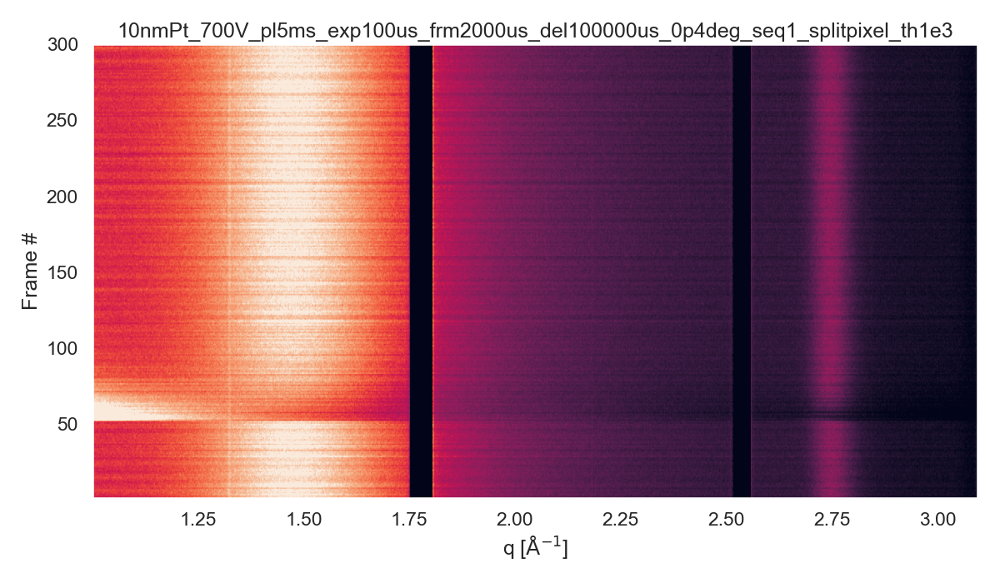

In [27]:
fig2, ax2 = plt.subplots(ncols=1, figsize=(12, 7), layout='tight')

iq_dict = {}
processed_scans = [p.stem[:-17] for p in os_sorted(list(save_path_method.glob('*_processed_masked.h5')))]
if len(processed_scans) > 0:
    NSlider=IntSlider(min=1, max=2, step=1, value=0)
    @interact(scan=Dropdown(options=processed_scans, value=processed_scans[-1]),
              xlim=FloatRangeSlider(min=0, max=6, value=(1, 3.5), step=0.1),
              bg_range=FloatRangeSlider(min=0, max=6, value=(2.2, 2.3), step=0.05),
              minmax=FloatRangeSlider(min=0, max=100, step=0.5, value=(5,98)),
              normalize=False
             )
    def show_iq(scan, xlim, bg_range, minmax, normalize):
        ax2.cla()
        ax2.grid(False)

        iq_file = save_path_method / f'{scan}_processed_masked.h5'
        q_, i_q_ = load_existing_data(iq_file)

        iq_dict[scan] = i_q_
        #q_, i_q_ = All_IQs[scan][0], All_IQs[scan][1]
        q, i_q = q_.copy(), i_q_.copy()
        if normalize:
            bg_inds = (q[0] >= bg_range[0]) & (q[0] <= bg_range[1])
            bg_norm = np.nanmean(i_q[:, bg_inds], axis=1)
            i_q /= bg_norm[:, np.newaxis]
        
        inds = (q[0] >= xlim[0]) & (q[0] <= xlim[1])
        q, i_q = q[:, inds], i_q[:, inds]
    
        vminmax = np.nanpercentile(i_q, minmax)
        
        ax2.imshow(i_q, extent=(q.min(), q.max(), 1, i_q.shape[0]),
                   vmin=vminmax[0], vmax=vminmax[1], aspect='auto',
                   origin='lower')
        ax2.set_xlabel(rf'q [${AA}$]')
        ax2.set_ylabel('Frame #')
        ax2.set_title('{}'.format(scan))

In [37]:
iq_bb = iq_dict['10nmPt_700V_pl5ms_exp100us_frm2000us_del100000us_0p4deg_seq1_cython_th1e3']
iq_sp = iq_dict['10nmPt_700V_pl5ms_exp100us_frm2000us_del100000us_0p4deg_seq1_numpy_th1e3']

print(np.sum(iq_bb - iq_sp))

0.05662097


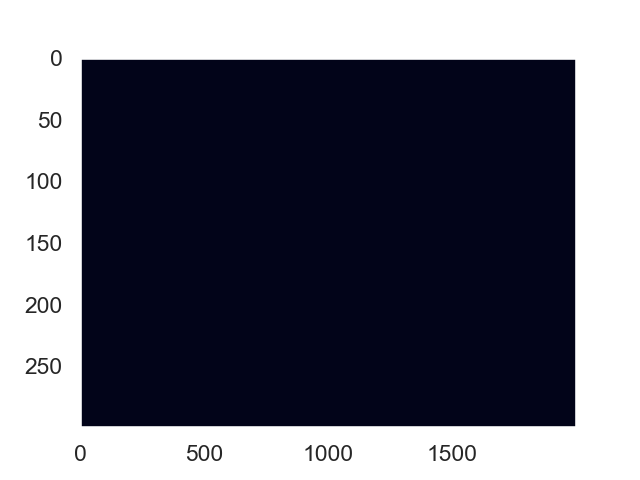

In [38]:
plt.figure()

iq_d = iq_bb - iq_sp 

minmax = np.nanpercentile(iq_d, (5,95))
plt.imshow(iq_d, vmin=minmax[0], vmax=minmax[1], aspect='auto')
plt.grid(False)

In [38]:
img_paths = [
    base_path / 'newflash_8keV',
]

master_files = reduce(operator.add, [list(img_path.glob('*_master.h5')) for img_path in img_paths])
scan_h5s = {m.stem[:-7]:m for m in master_files}
corrupted_files = []

def integrate_1d(eiger_h5, n, npt=4000, mask=None, method='csr', unit="q_A^-1", threshold=1e9):
    mask[mask > threshold] = 1
    image = get_single_image(eiger_h5, n, mask=mask)
    return ai.integrate1d(image, npt=npt, mask=mask, method=method, unit=unit)
    
def save_results(iq_file, q_all, I_all):
    with h5py.File(iq_file, 'w') as h5file:
        h5file.create_dataset('q_all', data=q_all)
        h5file.create_dataset('I_all', data=I_all)
    # print(f'Processed - Data saved to {iq_file}')

def load_existing_data(iq_file):
    with h5py.File(iq_file, 'r') as h5file:
        return h5file['q_all'][:], h5file['I_all'][:]

def process_scan(scan, save_path, npt=4000, mask=None, method='csr', unit="q_A^-1", threshold=1e9, reprocess=False):
    print(f'{scan} {whsp}', end='\r')
    iq_file = save_path / f'{scan}_processed_masked.h5'

    if os.path.exists(iq_file) and not reprocess:
        print(f'\r{scan} already processed ', end='\r')
        return load_existing_data(iq_file)

    eiger_h5 = scan_h5s[scan]
    nframes = get_nImages(eiger_h5)
    if nframes is None:
        print(f'{scan}: Corrupted Data {whsp}', end='\r')
        corrupted_files.append(scan)
        return None, None
        
    print(f'{scan}: {nframes} Images {whsp}', end='\r')
    results = Parallel(n_jobs=-1, require='sharedmem')(delayed(integrate_1d) (eiger_h5, n, npt, mask, method, unit, threshold) for n in range(0, nframes))

    q_all, I_all = map(np.array, zip(*results))
    save_results(iq_file, q_all, I_all)

    print(f'{scan}: {nframes} Images - Processed {whsp}', end='\r')
    return q_all, I_all

reprocess = True
t0 = time.time()

#'lut', 'csr', ' npslit_csr', 'full_csr'
for scan in list(scan_h5s.keys())[:]:
    q_all, I_all = process_scan(scan, save_path, npt=2000, mask=mask, method='csr', unit="q_A^-1", threshold=1e3, reprocess=reprocess)
    if q_all is not None:
        All_IQs[scan] = (q_all, I_all)

print(f'\nAll scans processed - Total time: {time.time() - t0:.1f}s')

7nmMFM250C06_716V_pl5ms_exp1000000us_frm1000ms_0p4deg_postflash_avgTest4: 10 Images - Processed                                                      
All scans processed - Total time: 40.8s


In [ ]:
cython
All scans processed - Total time: 32.3s

numpy
All scans processed - Total time: 53.2s

BBox
All scans processed - Total time: 30.4s

splitpixel
All scans processed - Total time: 36.4s

lut
All scans processed - Total time: 33.0s

csr
All scans processed - Total time: 33.3s

npslit_csr - NO
All scans processed - Total time: 32.9s

full_csr
All scans processed - Total time: 33.0s